In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from numba import jit

mpl.rcParams['font.family'] = 'Times New Roman'
mpl.rcParams['font.size'] = 16               # 본문 크기
mpl.rcParams['axes.labelsize'] = 18         # 축 라벨
mpl.rcParams['xtick.labelsize'] = 16
mpl.rcParams['ytick.labelsize'] = 16
mpl.rcParams['legend.fontsize'] = 16
mpl.rcParams['mathtext.fontset'] = 'cm'      # LaTeX 수식은 Computer Modern 유지
mpl.rcParams['axes.linewidth'] = 1.0   

In [2]:
from Simul import get_RQ_MOA4,get_RQ_MOA5,get_RQ_MOA2,get_R_simul_wfT,RK4,to_complex
import numpy as np
import matplotlib.pyplot as plt
from parfor import parfor

In [44]:
N =10000
N1,N2 = N,N
K = 1
alphas = np.linspace(0,np.pi/2,100)
betas = np.linspace(0,1,101)[1:]

In [4]:
beta = betas[0]
A =  np.load(f'SIMUL OA/beta = {beta} N = {N}.npz')

FileNotFoundError: [Errno 2] No such file or directory: 'SIMUL OA/beta = 0.01 N = 1000.npz'

In [ ]:
Q1s = np.zeros((100,100,len(A['Q1'][0])))
Q2s = np.zeros((100,100,len(A['Q2'][0])))
R1s = np.zeros((100,100,len(A['R1'][0])))
R2s = np.zeros((100,100,len(A['R2'][0])))
for i,beta in enumerate(betas):
    A =  np.load(f'SIMUL OA/beta = {beta} N = {N}.npz')
    Q1s[i,:,:] = A['Q1']
    Q2s[i,:,:] = A['Q2']
    R2s[i,:,:] = A['R2']
    R1s[i,:,:] = A['R1']

In [10]:
alpha = 0.2
beta = 0.2
eta1 = 0.1
eta2 = 0.0
shift = 0
N = 1000
Q1 = 1
Q2 = 0.6
t_end = 20_001
t = np.arange(0,t_end,0.1)

In [ ]:
N1 = N2 = N
A1 = np.sqrt(Q1)
A2 = np.sqrt(Q2)
a1 =  A1 *np.exp(0j)
b1 =  a1 * np.exp(np.pi*1j)
a2 =  A2*np.exp(shift*1j)
b2 =  a2* np.exp(np.pi*1j)
T1 = np.r_[np.zeros(int((1/2 + eta1/2)*N)),np.pi* np.ones(N - int((1/2 + eta1/2)*N))]
T2 = gen_dist(N,a2,b2,eta2)
Theta =  np.r_[T1,T2]

In [5]:
@jit(nopython=True)
def dZ4_dt(Zs,t,alpha,beta,eta1,eta2):
    a1real,a1imag,b1real,b1imag,a2real,a2imag,b2real,b2imag = Zs
    a1 = a1real + 1j*a1imag
    a2 = a2real + 1j*a2imag
    b1 = b1real + 1j*b1imag
    b2 = b2real + 1j*b2imag
    
    
    Z11 = (1-2*eta1) * np.conj(a1)
    Z12 = (1-2*eta2) * np.conj(a2)
    
    H1 = (Z11**2 + 2*beta*Z11*Z12 + beta**2*Z12**2)
    H2 = (Z12**2 + 2*beta*Z11*Z12 + beta**2*Z11**2)
    A = np.exp(1j*alpha)
    AS = np.exp(-1j*alpha)
    da1 = 1/2 *(np.conj(H1)/a1*A - H1*a1**3*AS )
    da2 = 1/2 *(np.conj(H2)/a2*A - H2*a2**3*AS )
    db1 = 1/2 *(np.conj(H1)/b1*A - H1*a1**3*AS )
    db2 = 1/2 *(np.conj(H2)/b2*A - H2*a2**3*AS )
    
    return np.array([da1.real,da1.imag, db1.real,db1.imag, da2.real,da2.imag, db2.real,db2.imag])

In [6]:
def get_RQ_MOA4(Q1,Q2,alpha,beta,eta1,eta2,shift=0,t_end = 5000,dt=0.1):
    a1 =  np.sqrt(Q1)*np.exp(0j)
    b1 =  np.sqrt(Q1)*np.exp(0j)
    a2 =  np.sqrt(Q2)*np.exp(0j)
    b2 =  np.sqrt(Q2)*np.exp(0j)


    t = np.arange(0,t_end,dt)
    Zs = RK4(dZ4_dt,np.array([a1.real,a1.imag,b1.real,b1.imag,a2.real,a2.imag,b2.real,b2.imag]),t,args=(alpha,beta,eta1,eta2))
    a1s,b1s,a2s,b2s = to_complex(Zs)

    RZ1 = (1-2*eta1) * np.conj(a1s)
    QZ1 = np.conj(b1s)**2
    RZ2 = (1-2*eta2) * np.conj(a2s)
    QZ2 = np.conj(b2s)**2

    R1s = np.abs(RZ1)
    R2s = np.abs(RZ2)
    Q1s = np.abs(QZ1)
    Q2s = np.abs(QZ2)
    return R1s,R2s,Q1s,Q2s,t

In [68]:
Q_init = 0.6
alpha = 1
beta = 1
eta1 = 0.55
eta2 = 0.5
shift = 0 
alpha = np.pi/4
beta = 0.5
t_end = 20_001
R1,R2,Q1,Q2,t = get_RQ_MOA4(1,Q_init,alpha=alpha,beta=beta,eta1=eta1,eta2=eta2,shift=shift,t_end=t_end,dt=0.1)

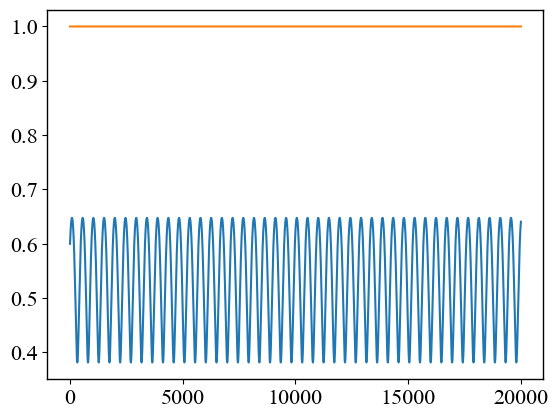

In [46]:
plt.plot(t,Q2s,label='R1')
plt.plot(t,Q1s,label='R1')

In [38]:
from pathlib import Path
from tqdm import tqdm
from parfor import parfor
import numpy as np

for alpha in tqdm(alphas[:]):

    save_path = Path(f"SIMUL OA UNIFORM/alpha = {alpha}.npz")

    if save_path.exists():
        print(f"skip alpha = {alpha}")
        continue

    @parfor(betas, bar=False)
    def get_beta(beta):
        R1s,R2s,Q1s,Q2s,t = get_RQ_MOA4(1,Q_init,alpha=alpha,beta=beta,eta1=eta1,eta2=eta2,shift=shift,t_end=t_end,dt=0.1)

        R1 = np.abs(R1s)[::100]
        R2 = np.abs(R2s)[::100]
        Q1 = np.abs(Q1s)[::100]
        Q2 = np.abs(Q2s)[::100]

        return R1, R2, Q1, Q2

    R1, R2, Q1, Q2 = zip(*get_beta)    
    

    np.savez(save_path, R1=R1, R2=R2, Q1=Q1, Q2=Q2)

100%|██████████| 100/100 [04:51<00:00,  2.91s/it]


In [83]:
eta1 = 0.7
eta2 = 0.5
R1s_OA,R2s_OA,Q1s_OA,Q2s_OA,t = get_RQ_MOA4(1,Q_init,alpha=alpha,beta=beta,eta1=eta1,eta2=eta2,shift=shift,t_end=t_end,dt=0.1)

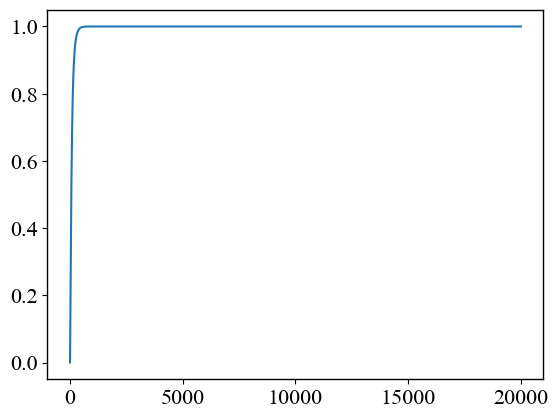

In [13]:
plt.plot(t,Z2bs,label='Q1')

In [12]:
plt.plot(t,Q2s_OA,label='Q1')
plt.plot(t,Z2bs)

NameError: name 'Q2s_OA' is not defined

(0.0, 2000.0)

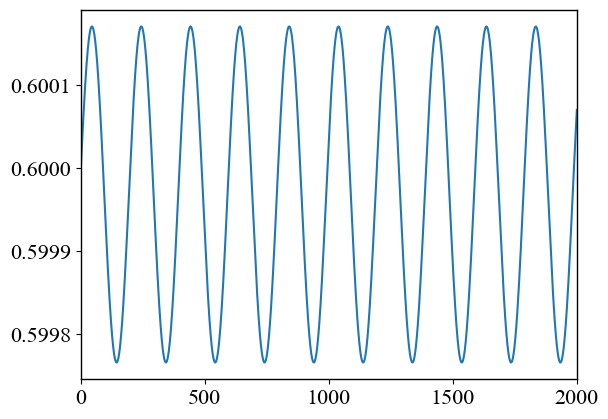

In [22]:
plt.plot(Q2s[0,10,:])
plt.xlim(0,2000)

In [27]:
t_end = 20_001
t = np.arange(0,t_end,0.1)

In [20]:
t_temp = t[::100]
len(t_temp)

2001

(array([0. , 0.2, 0.4, 0.6, 0.8, 1. ]),
 [Text(0, 0.0, '0.0'),
  Text(0, 0.2, '0.2'),
  Text(0, 0.4, '0.4'),
  Text(0, 0.6000000000000001, '0.6'),
  Text(0, 0.8, '0.8'),
  Text(0, 1.0, '1.0')])

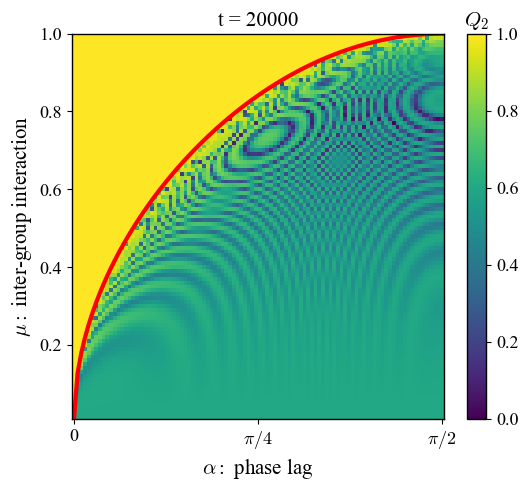

In [21]:
fig,(ax1) = plt.subplots(1,1,figsize=(6,5),dpi=100)

index = -1
im1 = ax1.pcolormesh(alphas,betas,Q2s[:,:,index],vmin=0.0, vmax=1)
ax1.set_aspect('auto')
text = ax1.set_title(rf't = {t_temp[index] :.0f}',fontsize=15)

cbar1 = fig.colorbar(im1,ax=ax1,shrink=1)
cbar1.ax.set_title(r'$Q_2$',fontsize=15)
cbar1.ax.tick_params(labelsize=13)
plt.sca(ax1)
ax1.plot(alphas,np.sqrt(np.sin(alphas)),color='red',lw=3)

plt.xlabel(r'$\alpha:$ phase lag',fontsize = 15)
plt.ylim(betas[0],1)
plt.ylabel(r'$\mu:$ inter-group interaction',fontsize = 15)
plt.xticks([0,np.pi/4,np.pi/2],[0,'$\pi/4$','$\pi/2$'],fontsize=13)
plt.yticks(fontsize=13)


In [47]:
from Simul import RK4_ZZ2,gen_dist,Kuramoto_MF_CHIMERA,bimodal_gaussian_dist
from scipy.integrate import cumulative_trapezoid
from scipy.interpolate import interp1d

In [48]:
def dist_ab(x, a, b, eta):
    a_ = a*np.exp(1j*x)/(1-a*np.exp(1j*x))
    b_ = b*np.exp(1j*x)/(1-b*np.exp(1j*x))
    f1 = 1/(2*np.pi) * (1+ (a_+a_.conjugate()))
    f2 = 1/(2*np.pi) * (1+ (b_+b_.conjugate()))
    f = (eta) *f1+ (1-eta) *f2
    return abs(f)


def gen_dist(N,a,b,eta,seed = None):
    x = np.linspace(-np.pi/2, 3*np.pi/2, 10000)
    pdf = dist_ab(x,a,b,eta)
    cdf = cumulative_trapezoid(pdf, x, initial=0)
    cdf /= cdf[-1]  # 정규화
    quantile_func = interp1d(cdf, x, kind='nearest', fill_value='extrapolate')
    if seed != None:
        np.random.seed(seed)
        ps = np.random.uniform(0,1,N)
    else:
        ps = (np.arange(N+1)[:-1] + 1)/(N+1)
    T = quantile_func(ps)
    return T

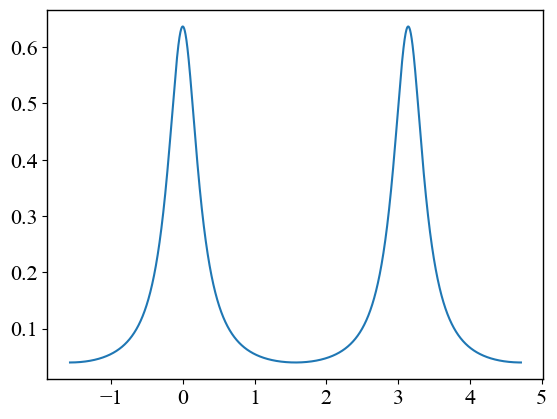

In [6]:
x = np.linspace(-np.pi/2, 3*np.pi/2, 10000)
a2 = np.sqrt(0.6)*np.exp(0j)
b2 = a2 * np.exp(np.pi*1j)
eta2 =0.5
pdf = dist_ab(x,a2,b2,eta2)
plt.plot(x,pdf)

In [7]:
eta1 = 0.7

In [49]:
N = 10000
a2 = np.sqrt(0.6)*np.exp(0j)
b2 = a2 * np.exp(np.pi*1j)

eta1 = 0.55
eta2 = 0.5

T1 = np.r_[np.zeros(int((eta1)*N)),np.pi* np.ones(N - int((eta1)*N))]
T2 = gen_dist(N,a2,b2,eta2)
# T2 = bimodal_gaussian_dist(N, eta2, 0.6)
Theta =  np.r_[T1,T2]

In [50]:
(Z1as,Z1bs,Z2as,Z2bs) = RK4_ZZ2(Kuramoto_MF_CHIMERA,Theta.copy(),t,args=(N1,N2,beta,alpha,K))

In [52]:
np.savez(f'SIMUL N10000/ALPHA pi4 mu 0.5.npz', R1_sim=Z1as, R2_sim=Z1bs, Q1_sim=Z2as, Q2_sim=Z2bs, R1=R1s,R2=R2s,Q1=Q1s,Q2=Q2s, t=t)

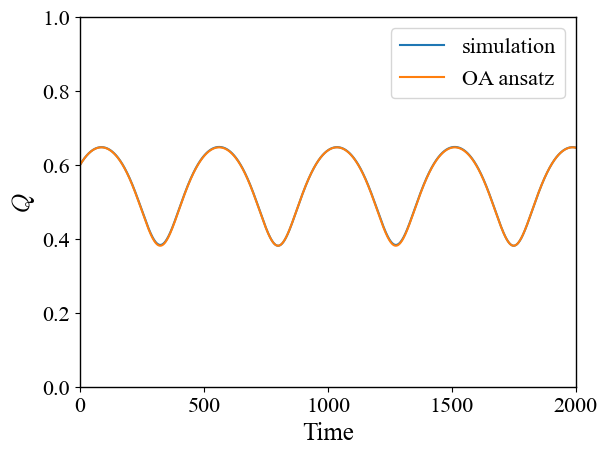

In [62]:
# plt.plot(t,Z1as,label='R1')
plt.plot(t,np.abs(Z2bs),label=r'simulation')
plt.plot(t,np.abs(Q2s),label=r'OA ansatz')
plt.ylim(0,1)
plt.xlim(0,2000)
plt.xlabel('Time')
plt.ylabel(r'$Q$')
plt.legend()
plt.show()

In [18]:
len(T1)

1000

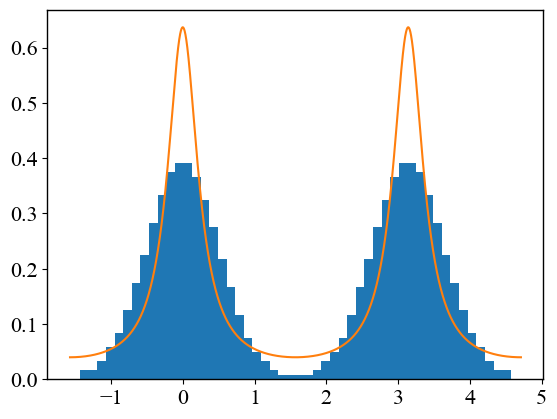

In [11]:
plt.hist(T2,bins=50,density=True);
plt.plot(x,pdf)

In [ ]:
from pathlib import Path
from tqdm import tqdm
from parfor import parfor
import numpy as np

for alpha in tqdm(alphas[:]):

    save_path = Path(f"SIMUL N1000 gaussian/ alpha = {alpha}.npz")

    if save_path.exists():
        print(f"skip alpha = {alpha}")
        continue

    @parfor(betas, bar=False)
    def get_beta(beta):
        Z1as, Z1bs, Z2as, Z2bs = RK4_ZZ2(
            Kuramoto_MF_CHIMERA,
            Theta.copy(),
            t,
            args=(N1, N2, beta, alpha, K)
        )

        R1 = np.abs(Z1as)[::100]
        R2 = np.abs(Z1bs)[::100]
        Q1 = np.abs(Z2as)[::100]
        Q2 = np.abs(Z2bs)[::100]

        return R1, R2, Q1, Q2

    R1, R2, Q1, Q2 = zip(*get_beta)    
    

    np.savez(save_path, R1=R1, R2=R2, Q1=Q1, Q2=Q2)

  0%|          | 0/100 [00:00<?, ?it/s]

skip alpha = 0.0
skip alpha = 0.015866629563584814
skip alpha = 0.03173325912716963
skip alpha = 0.04759988869075445
skip alpha = 0.06346651825433926
skip alpha = 0.07933314781792407
skip alpha = 0.0951997773815089
skip alpha = 0.1110664069450937
skip alpha = 0.12693303650867852
skip alpha = 0.14279966607226333
skip alpha = 0.15866629563584814
skip alpha = 0.17453292519943295
skip alpha = 0.1903995547630178
skip alpha = 0.2062661843266026
skip alpha = 0.2221328138901874
skip alpha = 0.23799944345377222
skip alpha = 0.25386607301735703
skip alpha = 0.26973270258094184
skip alpha = 0.28559933214452665
skip alpha = 0.30146596170811146
skip alpha = 0.3173325912716963
skip alpha = 0.3331992208352811
skip alpha = 0.3490658503988659
skip alpha = 0.3649324799624507
skip alpha = 0.3807991095260356


c:\Users\kim9y\anaconda3\envs\ray-cluster\Lib\site-packages\parfor\gil.py:405: UserWarning: Parfor: Closing pool timed out, 2 processes still alive.
  warn(f'Parfor: Closing pool timed out, {instance.n_workers.value} processes still alive.')
100%|██████████| 100/100 [4:22:16<00:00, 157.36s/it] 


In [ ]:
from tqdm import tqdm
from parfor import parfor
for alpha in tqdm(alphas[:]):
    # print(alpha)
    @parfor(betas,bar=False)
    def get_beta(beta):
        (Z1as,Z1bs,Z2as,Z2bs) = RK4_ZZ2(Kuramoto_MF_CHIMERA,Theta.copy(),t,args=(N1,N2,beta,alpha,K))
        R1 = np.abs(Z1as)[::100]
        R2 = np.abs(Z1bs)[::100]
        Q1 = np.abs(Z2as)[::100]
        Q2 = np.abs(Z2bs)[::100]
        return R1,R2,Q1,Q2
    R1,R2,Q1,Q2 = zip(*get_beta)
    np.savez(f'SIMUL N1000 gaussian/ alpha = {alpha}',R1=R1,R2=R2,Q1=Q1,Q2=Q2)

  0%|          | 0/100 [00:00<?, ?it/s]

0.0


  1%|          | 1/100 [03:41<6:05:26, 221.48s/it]

0.015866629563584814


  2%|▏         | 2/100 [07:32<6:10:44, 226.98s/it]

0.03173325912716963


  3%|▎         | 3/100 [11:32<6:16:21, 232.80s/it]

0.04759988869075445


  4%|▍         | 4/100 [15:18<6:08:15, 230.17s/it]

0.06346651825433926


  5%|▌         | 5/100 [19:14<6:07:58, 232.40s/it]

0.07933314781792407


  6%|▌         | 6/100 [23:11<6:06:19, 233.82s/it]

0.0951997773815089


  7%|▋         | 7/100 [27:11<6:05:30, 235.81s/it]

0.1110664069450937


  8%|▊         | 8/100 [31:07<6:01:49, 235.98s/it]

0.12693303650867852


  9%|▉         | 9/100 [34:59<5:56:00, 234.74s/it]

0.14279966607226333


 10%|█         | 10/100 [38:50<5:50:25, 233.62s/it]

0.15866629563584814


 11%|█         | 11/100 [42:47<5:47:54, 234.54s/it]

0.17453292519943295


 12%|█▏        | 12/100 [46:41<5:43:55, 234.50s/it]

0.1903995547630178


 13%|█▎        | 13/100 [50:37<5:40:40, 234.95s/it]

0.2062661843266026


 14%|█▍        | 14/100 [54:37<5:38:56, 236.47s/it]

0.2221328138901874


 15%|█▌        | 15/100 [58:42<5:38:46, 239.13s/it]

0.23799944345377222


 16%|█▌        | 16/100 [1:02:36<5:32:21, 237.39s/it]

0.25386607301735703


 17%|█▋        | 17/100 [1:06:22<5:23:47, 234.07s/it]

0.26973270258094184


 18%|█▊        | 18/100 [1:10:09<5:17:00, 231.95s/it]

0.28559933214452665


 19%|█▉        | 19/100 [1:13:58<5:11:54, 231.04s/it]

0.30146596170811146


 20%|██        | 20/100 [1:17:44<5:06:14, 229.68s/it]

0.3173325912716963


 21%|██        | 21/100 [1:21:39<5:04:22, 231.18s/it]

0.3331992208352811


 22%|██▏       | 22/100 [1:25:44<5:06:03, 235.43s/it]

0.3490658503988659


 23%|██▎       | 23/100 [1:30:34<5:23:01, 251.71s/it]

0.3649324799624507


 24%|██▍       | 24/100 [1:36:48<6:05:15, 288.36s/it]

0.3807991095260356


 25%|██▌       | 25/100 [1:45:06<7:19:07, 351.30s/it]

0.3966657390896204


 25%|██▌       | 25/100 [1:46:46<5:20:18, 256.25s/it]


KeyboardInterrupt: 

In [101]:
Z1as, Z1bs, Z2as, Z2bs = zip(*get_beta)

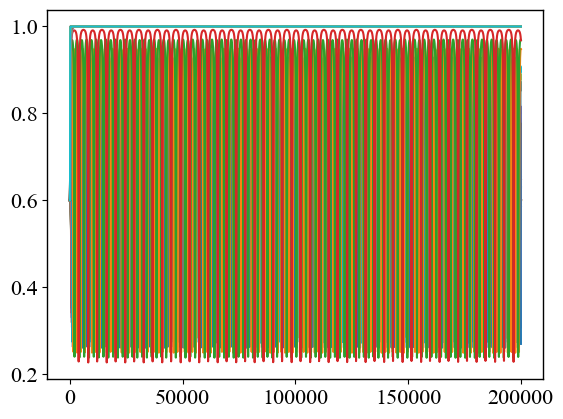

In [112]:
plt.plot(np.abs(np.array(Z2bs)).T)

In [113]:
import numpy as np
from numba import njit, prange


@njit
def _z1_z2(theta, Na, Nb):
    re1a = 0.0
    im1a = 0.0
    re2a = 0.0
    im2a = 0.0

    for i in range(Na):
        th = theta[i]
        c = np.cos(th)
        s = np.sin(th)

        re1a += c
        im1a += s

        # exp(2 i theta) = cos(2theta) + i sin(2theta)
        re2a += c * c - s * s
        im2a += 2.0 * c * s

    re1b = 0.0
    im1b = 0.0
    re2b = 0.0
    im2b = 0.0

    for i in range(Na, Na + Nb):
        th = theta[i]
        c = np.cos(th)
        s = np.sin(th)

        re1b += c
        im1b += s

        re2b += c * c - s * s
        im2b += 2.0 * c * s

    invNa = 1.0 / Na
    invNb = 1.0 / Nb

    Z1a = re1a * invNa + 1j * im1a * invNa
    Z2a = re2a * invNa + 1j * im2a * invNa
    Z1b = re1b * invNb + 1j * im1b * invNb
    Z2b = re2b * invNb + 1j * im2b * invNb

    return Z1a, Z1b, Z2a, Z2b


@njit
def _z1_only(theta, Na, Nb):
    re1a = 0.0
    im1a = 0.0

    for i in range(Na):
        th = theta[i]
        re1a += np.cos(th)
        im1a += np.sin(th)

    re1b = 0.0
    im1b = 0.0

    for i in range(Na, Na + Nb):
        th = theta[i]
        re1b += np.cos(th)
        im1b += np.sin(th)

    invNa = 1.0 / Na
    invNb = 1.0 / Nb

    Z1a = re1a * invNa + 1j * im1a * invNa
    Z1b = re1b * invNb + 1j * im1b * invNb

    return Z1a, Z1b


@njit
def _rhs_given_z1(theta, out, Na, Nb, beta, alpha, K, Z1a, Z1b):
    A = np.cos(alpha) - 1j * np.sin(alpha)

    ZZa = K * (Z1a + beta * Z1b)
    ZZb = K * (Z1b + beta * Z1a)

    Ca = A * ZZa * ZZa
    Cb = A * ZZb * ZZb

    Ca_re = Ca.real
    Ca_im = Ca.imag
    Cb_re = Cb.real
    Cb_im = Cb.imag

    # dtheta = imag(C * exp(-2 i theta))
    # exp(-2 i theta) = cos(2theta) - i sin(2theta)
    # imag((a+ib)(c-is)) = b*c - a*s

    for i in range(Na):
        th2 = 2.0 * theta[i]
        c2 = np.cos(th2)
        s2 = np.sin(th2)
        out[i] = Ca_im * c2 - Ca_re * s2

    for i in range(Na, Na + Nb):
        th2 = 2.0 * theta[i]
        c2 = np.cos(th2)
        s2 = np.sin(th2)
        out[i] = Cb_im * c2 - Cb_re * s2


@njit
def _rhs_z1_only(theta, out, Na, Nb, beta, alpha, K):
    Z1a, Z1b = _z1_only(theta, Na, Nb)
    _rhs_given_z1(theta, out, Na, Nb, beta, alpha, K, Z1a, Z1b)


@njit
def RK4_ZZ2_chimera_fast(y0, t, Na, Nb, beta, alpha, K):
    n = len(t)
    N = Na + Nb

    y = y0.copy()

    k1 = np.empty_like(y)
    k2 = np.empty_like(y)
    k3 = np.empty_like(y)
    k4 = np.empty_like(y)
    ytmp = np.empty_like(y)

    Z1as = np.empty(n, dtype=np.complex64)
    Z1bs = np.empty(n, dtype=np.complex64)
    Z2as = np.empty(n, dtype=np.complex64)
    Z2bs = np.empty(n, dtype=np.complex64)

    # initial Z
    Z1a, Z1b, Z2a, Z2b = _z1_z2(y, Na, Nb)
    Z1as[0] = Z1a
    Z1bs[0] = Z1b
    Z2as[0] = Z2a
    Z2bs[0] = Z2b

    # k1 for initial state
    _rhs_given_z1(y, k1, Na, Nb, beta, alpha, K, Z1a, Z1b)

    for i in range(n - 1):
        h = t[i + 1] - t[i]

        # 기존 RK4_ZZ2와 동일하게,
        # Z[i+1]에는 update 전 상태의 Z를 저장
        Z1as[i + 1] = Z1a
        Z1bs[i + 1] = Z1b
        Z2as[i + 1] = Z2a
        Z2bs[i + 1] = Z2b

        # k2
        for j in range(N):
            ytmp[j] = y[j] + 0.5 * h * k1[j]

        _rhs_z1_only(ytmp, k2, Na, Nb, beta, alpha, K)

        # k3
        for j in range(N):
            ytmp[j] = y[j] + 0.5 * h * k2[j]

        _rhs_z1_only(ytmp, k3, Na, Nb, beta, alpha, K)

        # k4
        for j in range(N):
            ytmp[j] = y[j] + h * k3[j]

        _rhs_z1_only(ytmp, k4, Na, Nb, beta, alpha, K)

        # update
        for j in range(N):
            y[j] = y[j] + (h / 6.0) * (
                k1[j] + 2.0 * k2[j] + 2.0 * k3[j] + k4[j]
            )

        # 다음 step의 k1과 Z를 미리 계산
        if i < n - 2:
            Z1a, Z1b, Z2a, Z2b = _z1_z2(y, Na, Nb)
            _rhs_given_z1(y, k1, Na, Nb, beta, alpha, K, Z1a, Z1b)

    return Z1as, Z1bs, Z2as, Z2bs

In [114]:
old = RK4_ZZ2(
    Kuramoto_MF_CHIMERA,
    Theta.copy(),
    t,
    args=(N1, N2, beta, alpha, K)
)

new = RK4_ZZ2_chimera_fast(
    Theta,
    t,
    N1,
    N2,
    beta,
    alpha,
    K
)

for a, b in zip(old, new):
    print(np.max(np.abs(a - b)), np.allclose(a, b, rtol=1e-5, atol=1e-7))

2.9802322e-08 True
7.275958e-12 True
5.9604645e-08 True
3.7252903e-09 True


In [116]:
old = RK4_ZZ2(
    Kuramoto_MF_CHIMERA,
    Theta.copy(),
    t,
    args=(N1, N2, beta, alpha, K)
)

In [115]:
new = RK4_ZZ2_chimera_fast(
    Theta,
    t,
    N1,
    N2,
    beta,
    alpha,
    K
)

## CHECK PERIOD

In [17]:
alphas = np.linspace(0,np.pi/2,100)
betas = np.linspace(0,1,101)[1:]
shift = 0
A,B = np.meshgrid(alphas,betas)

In [18]:
O = (1-2*eta1)**2*np.sqrt(np.sin(A)**2-B**4)
P = np.pi/O

C:\Users\kim9y\AppData\Local\Temp\ipykernel_37116\4012893600.py:1: RuntimeWarning: invalid value encountered in sqrt
  O = (1-2*eta1)**2*np.sqrt(np.sin(A)**2-B**4)
C:\Users\kim9y\AppData\Local\Temp\ipykernel_37116\4012893600.py:2: RuntimeWarning: divide by zero encountered in divide
  P = np.pi/O


In [19]:
P_vmax

NameError: name 'P_vmax' is not defined

Text(0, 0.5, '$\\mu$')

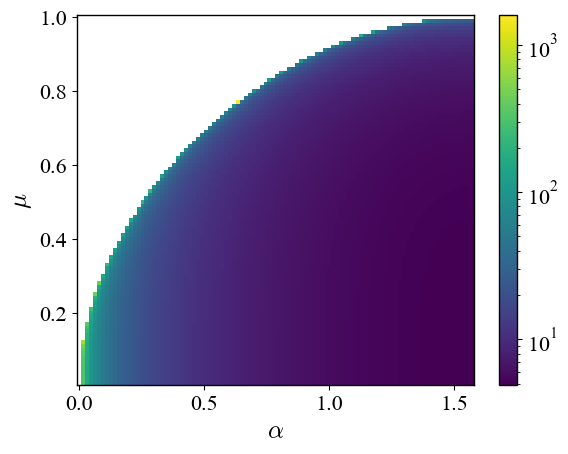

In [20]:
from matplotlib.colors import LogNorm
import numpy as np

# Remove invalid or non-finite values from P, A, B before plotting
finite_mask = np.isfinite(P) & (P > 0)
# Set P values that are not finite or <=0 to np.nan (to be safely ignored by pcolormesh)
P_plot = np.where(finite_mask, P, np.nan)

# Optionally, adjust vmin and vmax based on actual finite values
finite_P_vals = P[finite_mask]
if finite_P_vals.size > 0:
    P_vmin = np.nanmax([np.nanmin(finite_P_vals), 1e-3])
    P_vmax = np.nanmax(finite_P_vals)
else:
    P_vmin = 1e-3
    P_vmax = 1.0
plt.pcolormesh(A,B,P_plot,norm=LogNorm(vmin=P_vmin,vmax=P_vmax))

plt.colorbar()
plt.xlabel(r'$\alpha$')
plt.ylabel(r'$\mu$')

In [18]:
A =  np.load(f'SIMUL N1000 uniform/alpha = {alpha}.npz')

In [19]:
N =1000
N1,N2 = N,N
K = 1
alphas = np.linspace(0,np.pi/2,100)
betas = np.linspace(0,1,101)[1:]

In [20]:
t_end = 20_001
t = np.arange(0,t_end,0.1)
t_temp = t[::100]

In [39]:
Q1s = np.zeros((100,100,len(A['Q1'][0])))
Q2s = np.zeros((100,100,len(A['Q2'][0])))
R1s = np.zeros((100,100,len(A['R1'][0])))
R2s = np.zeros((100,100,len(A['R2'][0])))
for i,alpha in enumerate(alphas):
    A =  np.load(f'SIMUL OA UNIFORM/alpha = {alpha}.npz')
    # A =  np.load(f'SIMUL N1000 uniform/alpha = {alpha}.npz')
    Q1s[:,i,:] = A['Q1']
    Q2s[:,i,:] = A['Q2']
    R2s[:,i,:] = A['R2']
    R1s[:,i,:] = A['R1']

In [25]:
Q1s_sim = np.zeros((100,100,len(A['Q1'][0])))
Q2s_sim = np.zeros((100,100,len(A['Q2'][0])))
R1s_sim = np.zeros((100,100,len(A['R1'][0])))
R2s_sim = np.zeros((100,100,len(A['R2'][0])))
for i,alpha in enumerate(alphas):
    # A =  np.load(f'SIMUL N10000/alpha = {alpha}.npz')
    A =  np.load(f'SIMUL N1000 uniform/alpha = {alpha}.npz')
    Q1s_sim[:,i,:] = A['Q1']
    Q2s_sim[:,i,:] = A['Q2']
    R2s_sim[:,i,:] = A['R2']
    R1s_sim[:,i,:] = A['R1']

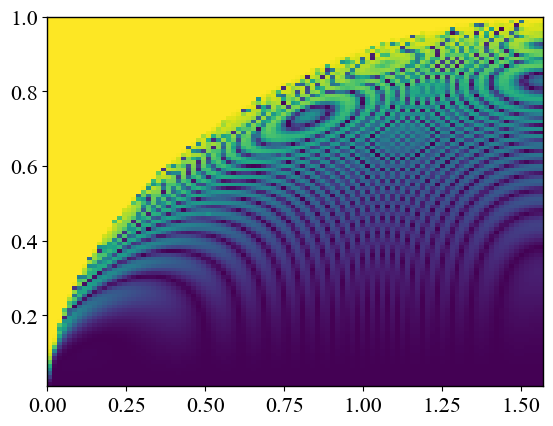

In [40]:
plt.imshow(Q2s[:,:,-1],extent=(0,np.pi/2,betas[0],1),aspect='auto',origin='lower')

(array([0. , 0.2, 0.4, 0.6, 0.8, 1. ]),
 [Text(0, 0.0, '0.0'),
  Text(0, 0.2, '0.2'),
  Text(0, 0.4, '0.4'),
  Text(0, 0.6000000000000001, '0.6'),
  Text(0, 0.8, '0.8'),
  Text(0, 1.0, '1.0')])

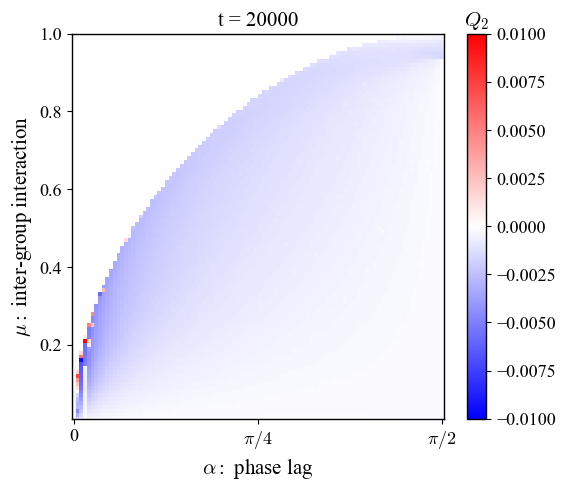

In [153]:

fig,(ax1) = plt.subplots(1,1,figsize=(6,5),dpi=100)

index = -1
DIFF = np.max(Q2s[:,:,-1000:],axis=(2))-np.max(Q2s_sim[:,:,-1000:],axis=(2))
im1 = ax1.pcolormesh(alphas,betas,DIFF,cmap='bwr',vmax=0.01,vmin=-0.01)
ax1.set_aspect('auto')
text = ax1.set_title(rf't = {t_temp[index] :.0f}',fontsize=15)

cbar1 = fig.colorbar(im1,ax=ax1,shrink=1)
cbar1.ax.set_title(r'$Q_2$',fontsize=15)
cbar1.ax.tick_params(labelsize=13)
plt.sca(ax1)
# ax1.plot(alphas,np.sqrt(np.sin(alphas)),color='red',lw=3)

plt.xlabel(r'$\alpha:$ phase lag',fontsize = 15)
plt.ylim(betas[0],1)
plt.ylabel(r'$\mu:$ inter-group interaction',fontsize = 15)
plt.xticks([0,np.pi/4,np.pi/2],[0,'$\pi/4$','$\pi/2$'],fontsize=13)
plt.yticks(fontsize=13)


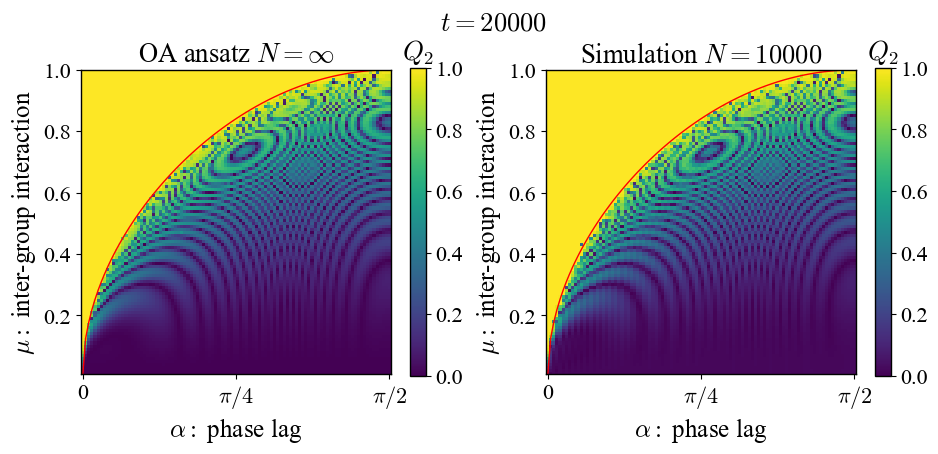

In [41]:
fig,(ax1,ax2) = plt.subplots(1,2,figsize=(11,5),dpi=100)

index = -1
im1 = ax1.pcolormesh(alphas,betas,Q2s[:,:,index],vmin=0, vmax=1)
ax1.set_aspect(np.pi/2)
text = ax1.set_title(rf'OA ansatz $N = \infty$')

cbar1 = fig.colorbar(im1,ax=ax1,shrink=0.8)
cbar1.ax.set_title(r'$Q_2$')
cbar1.ax.tick_params()


im1 = ax2.pcolormesh(alphas,betas,Q2s_sim[:,:,index],vmin=0, vmax=1)
ax2.set_aspect(np.pi/2)
text = ax2.set_title(rf'Simulation $N = 10000$')

cbar2 = fig.colorbar(im1,ax=ax2,shrink=0.8)
cbar2.ax.set_title(r'$Q_2$')
cbar2.ax.tick_params()

plt.suptitle(rf'$t = {t_temp[index] :.0f}$',y=0.92)


for ax in [ax1,ax2]:
    plt.sca(ax)
    ax.plot(alphas,np.sqrt(np.sin(alphas)),color='red',lw=1)
    # if ax == ax1:
    #     # plt.title('OA')
    plt.xlabel(r'$\alpha:$ phase lag',)
    plt.ylim(betas[0],1)
    plt.ylabel(r'$\mu:$ inter-group interaction',)
    plt.xticks([0,np.pi/4,np.pi/2],[0,'$\pi/4$','$\pi/2$'],)
    plt.yticks()
# plt.tight_layout()

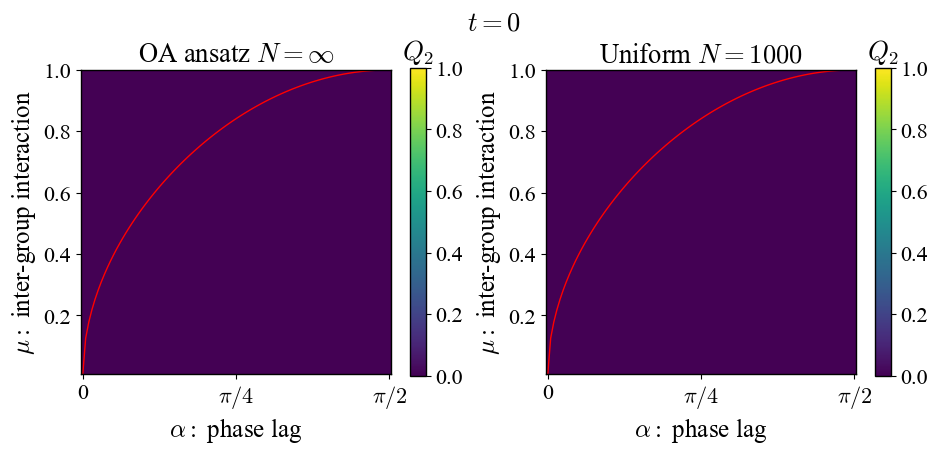

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5), dpi=100)

# 초기 프레임
index0 = 0

im_oa = ax1.pcolormesh(
    alphas, betas, Q2s[:, :, index0],
    vmin=0, vmax=1,
    shading='auto'
)

im_sim = ax2.pcolormesh(
    alphas, betas, Q2s_sim[:, :, index0],
    vmin=0, vmax=1,
    shading='auto'
)

ax1.set_aspect(np.pi / 2)
ax2.set_aspect(np.pi / 2)

ax1.set_title(r'OA ansatz $N = \infty$')
ax2.set_title(r'Uniform $N = 1000$')

cbar1 = fig.colorbar(im_oa, ax=ax1, shrink=0.8)
cbar1.ax.set_title(r'$Q_2$')

cbar2 = fig.colorbar(im_sim, ax=ax2, shrink=0.8)
cbar2.ax.set_title(r'$Q_2$')

# theoretical boundary
for ax in [ax1, ax2]:
    ax.plot(alphas, np.sqrt(np.sin(alphas)), color='red', lw=1)

    ax.set_xlabel(r'$\alpha:$ phase lag')
    ax.set_ylabel(r'$\mu:$ inter-group interaction')
    ax.set_ylim(betas[0], 1)

    ax.set_xticks([0, np.pi / 4, np.pi / 2])
    ax.set_xticklabels([0, r'$\pi/4$', r'$\pi/2$'])

title = fig.suptitle(rf'$t = {t_temp[index0]:.0f}$', y=0.92)

# plt.tight_layout()


def update(frame):
    im_oa.set_array(Q2s[:, :, frame].ravel())
    im_sim.set_array(Q2s_sim[:, :, frame].ravel())

    title.set_text(rf'$t = {t_temp[frame]:.0f}$')

    return im_oa, im_sim, title


anim = FuncAnimation(
    fig,
    update,
    frames=len(t_temp),
    interval=100,   # ms, 작을수록 빠름
    blit=False
)

HTML(anim.to_html5_video())

In [65]:
Q1s = np.zeros((100,100,len(A['Q1'][0])))
Q2s = np.zeros((100,100,len(A['Q2'][0])))
R1s = np.zeros((100,100,len(A['R1'][0])))
R2s = np.zeros((100,100,len(A['R2'][0])))
for i,beta in enumerate(betas):
    A =  np.load(f'SIMUL OA/beta = {beta} N = {N}.npz')
    Q1s[i,:,:] = A['Q1']
    Q2s[i,:,:] = A['Q2']
    R2s[i,:,:] = A['R2']
    R1s[i,:,:] = A['R1']

In [66]:
Q1s_sim = np.zeros((100,100,len(A['Q1'][0])))
Q2s_sim = np.zeros((100,100,len(A['Q2'][0])))
R1s_sim = np.zeros((100,100,len(A['R1'][0])))
R2s_sim = np.zeros((100,100,len(A['R2'][0])))
for i,alpha in enumerate(alphas):
    A =  np.load(f'SIMUL N10000/alpha = {alpha}.npz')
    # A =  np.load(f'SIMUL N1000 uniform/alpha = {alpha}.npz')
    Q1s_sim[:,i,:] = A['Q1']
    Q2s_sim[:,i,:] = A['Q2']
    R2s_sim[:,i,:] = A['R2']
    R1s_sim[:,i,:] = A['R1']

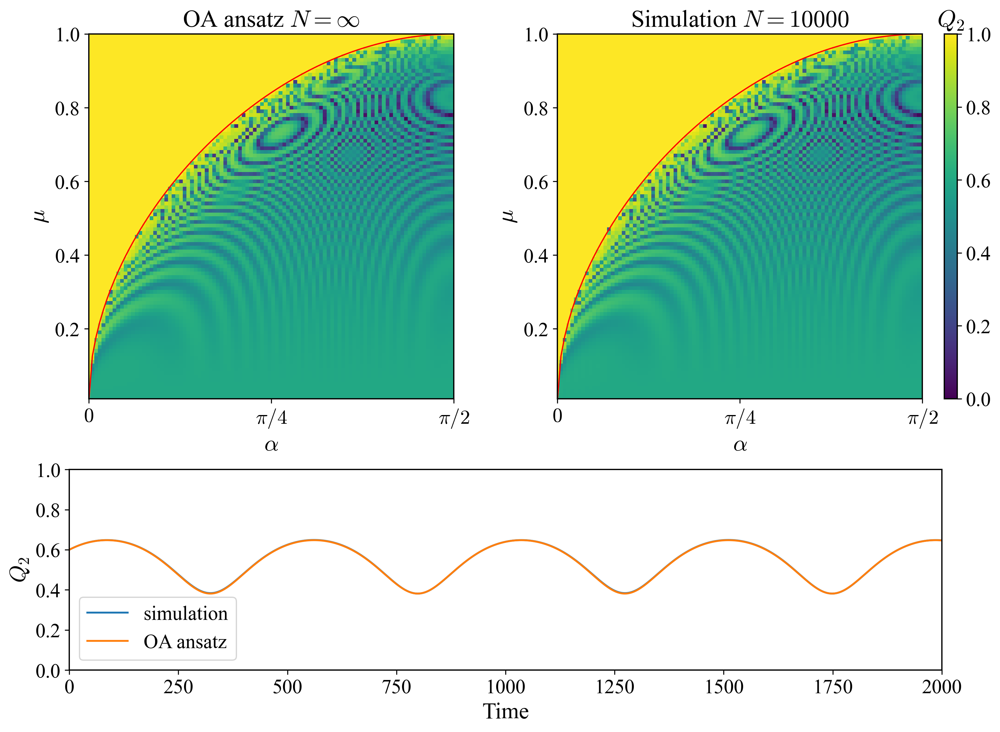

In [90]:
fig = plt.figure(figsize=(11, 8), dpi=300, constrained_layout=True)

gs = fig.add_gridspec(
    2, 2,
    height_ratios=[1, 0.55],
    width_ratios=[1, 1]
)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, :])

index = -1

# -------------------------
# Top-left
# -------------------------
im1 = ax1.pcolormesh(
    alphas, betas, Q2s[:, :, index],
    vmin=0, vmax=1,
    shading='auto'
)
ax1.set_title(r'OA ansatz $N=\infty$')
ax1.set_box_aspect(1)

# -------------------------
# Top-right
# -------------------------
im2 = ax2.pcolormesh(
    alphas, betas, Q2s_sim[:, :, index],
    vmin=0, vmax=1,
    shading='auto'
)
ax2.set_title(r'Simulation $N=10000$')
ax2.set_box_aspect(1)

# -------------------------
# Shared colorbar
# ax2 기준으로 높이 100%짜리 colorbar 생성
# -------------------------
cax = ax2.inset_axes([1.06, 0.0, 0.035, 1.0])
cbar = fig.colorbar(im2, cax=cax)
cbar.ax.set_title(r'$Q_2$')

# -------------------------
# Axis formatting
# -------------------------
for ax in [ax1, ax2]:
    ax.plot(alphas, np.sqrt(np.sin(alphas)), color='red', lw=1)

    ax.set_xlabel(r'$\alpha$')
    ax.set_ylabel(r'$\mu$')

    ax.set_xlim(0, np.pi / 2)
    ax.set_ylim(betas[0], 1)

    ax.set_xticks([0, np.pi/4, np.pi/2])
    ax.set_xticklabels([r'$0$', r'$\pi/4$', r'$\pi/2$'])

# -------------------------
# Bottom time series
# -------------------------
ax3.plot(t, np.abs(Z2bs), label='simulation')
ax3.plot(t, np.abs(Q2), label='OA ansatz')

ax3.set_xlim(0, 2000)
ax3.set_ylim(0, 1)
ax3.set_xlabel('Time')
ax3.set_ylabel(r'$Q_2$')
ax3.legend()

plt.show()